In [1]:
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = 'all'

%load_ext autoreload
%autoreload 2

In [2]:
from requests_toolbelt.multipart import decoder
import requests
import io
import os
import json
from PIL import Image

In [ ]:
# this example notebook will process the first 8 images with filenames ending in .jpg or .JPG in this directory
sample_input_dir = './sample_input/test_images'

ip_address = ''
port = ''
base_url = 'http://{}:{}/v1/camera-trap/detection-sync/'.format(ip_address, port)  # insert the IP address of the API
base_url

## Find out the version of the camera trap model used
Good endpoint to check that it is alive

In [4]:
version_info = requests.get(base_url + 'model_version')
version_info.text

'models/object_detection/faster_rcnn_inception_resnet_v2_atrous/megadetector'

## Calling the API

In [8]:
num_images_to_upload = 8  # the /detect endpoint currently accepts a maximum of 8 images

detection_confidence = 0.8  # a value from 0 to 1
render_boxes = True  # True to have returned result contain annotated image files; in any case a json with result will be returned

params = {
    'confidence': detection_confidence,
    'render': render_boxes
}

files = {}

num_images = 0
for i, image_name in enumerate(sorted(os.listdir(sample_input_dir))):
    if not image_name.lower().endswith('.jpg'):
        continue
    
    if num_images >= num_images_to_upload:
        break
    else:
        num_images += 1
    
    img_path = os.path.join(sample_input_dir, image_name)
    files[image_name] = (image_name, open(img_path, 'rb'), 'image/jpeg')

print('number of images to send:', len(files))

number of images to send: 8


In [9]:
r = requests.post(base_url + 'detect', 
                  params=params,
                  files=files)
r.status_code
r.ok
if not r.ok:
    r.reason
    r.text
r.elapsed.total_seconds()

200

True

5.024601

In [7]:
r.headers

{'Content-Type': 'multipart/form-data; boundary=7e2ed590ca534c86845e8f63ec5034f4', 'Content-Length': '1560772'}

## Reading the returned result

In [10]:
results = decoder.MultipartDecoder.from_response(r)

In [11]:
text_results = {}
images = {}
for part in results.parts:
    # part is a BodyPart object with b'Content-Type', and b'Content-Disposition', the later includes 'name' and 'filename' info
    headers = {}
    for k, v in part.headers.items():
        headers[k.decode(part.encoding)] = v.decode(part.encoding)
    if headers.get('Content-Type', None) == 'image/jpeg':
        #images[part.headers['filename']] = part.content
        c = headers.get('Content-Disposition')
        image_name = c.split('name="')[1].split('"')[0]  # somehow all the filename and name info is all in one string with no obvious forma
        image = Image.open(io.BytesIO(part.content))
        
        images[image_name] = image
    
    elif headers.get('Content-Type', None) == 'application/json':
        text_result = json.loads(part.content.decode())

In [12]:
text_result

{'S1_D04_R6_PICT0020.JPG': [[0.001224924810230732,
   0.014606326818466187,
   0.9491691589355469,
   0.6631066799163818,
   0.9976174235343933]],
 'S1_D04_R6_PICT0021.JPG': [[0.011180267669260502,
   0.028830915689468384,
   0.9308380484580994,
   0.7525489330291748,
   0.9974678754806519]],
 'S1_D04_R6_PICT0022.JPG': [[0.011515045538544655,
   0.11399456858634949,
   0.9100486636161804,
   1.0,
   0.9953194260597229]],
 'S1_D04_R6_PICT0128.JPG': [[0.5885019898414612,
   0.019416533410549164,
   0.6662891507148743,
   0.16861748695373535,
   0.8873207569122314]],
 'S1_D04_R6_PICT0129.JPG': [],
 'S1_D04_R6_PICT0130.JPG': [],
 'S1_D04_R6_PICT0221.JPG': [],
 'S1_D04_R6_PICT0222.JPG': [[0.5184586644172668,
   0.8762479424476624,
   0.6147490739822388,
   0.9712563157081604,
   0.9983211159706116]]}

S1_D04_R6_PICT0020.JPG


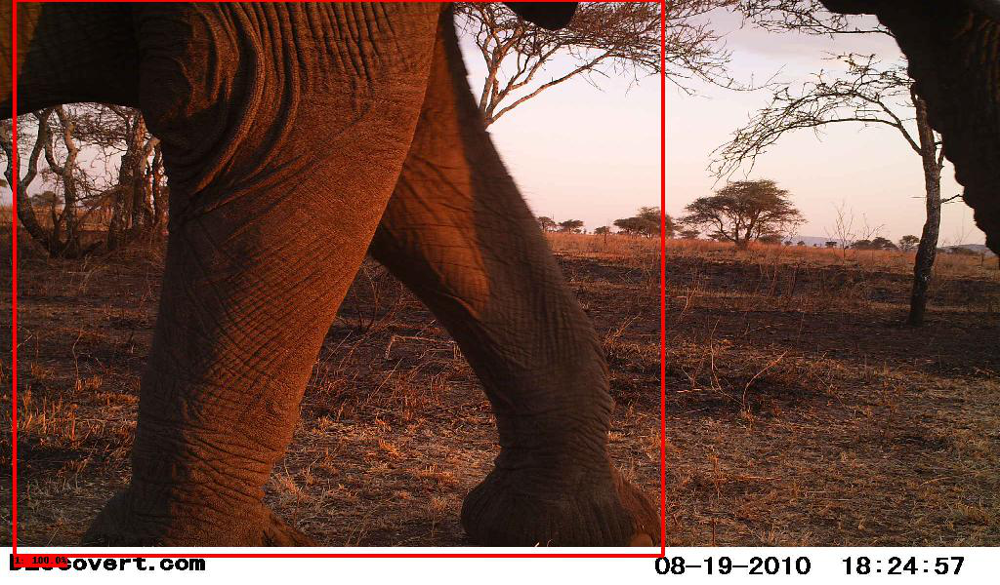


S1_D04_R6_PICT0021.JPG


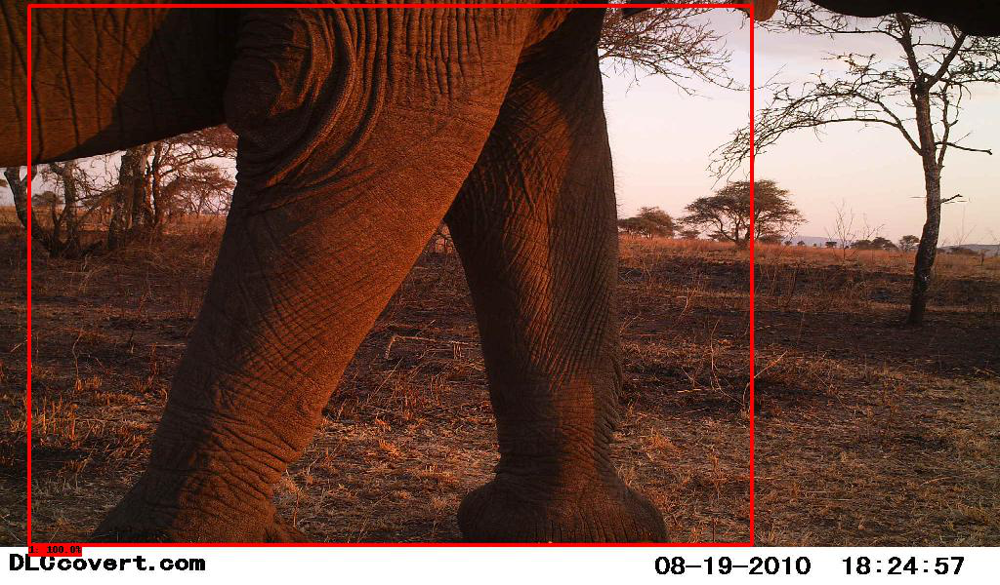


S1_D04_R6_PICT0022.JPG


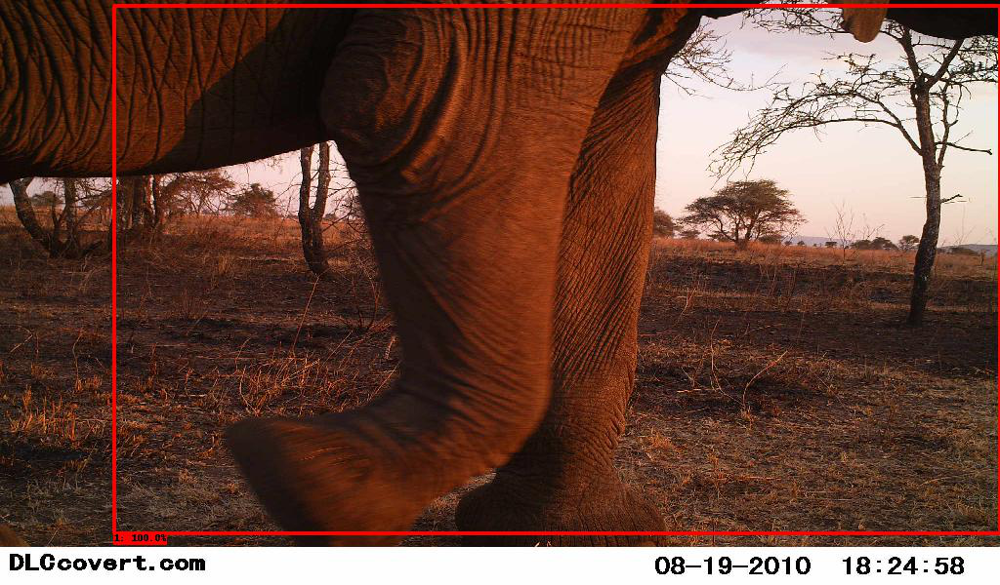


S1_D04_R6_PICT0128.JPG


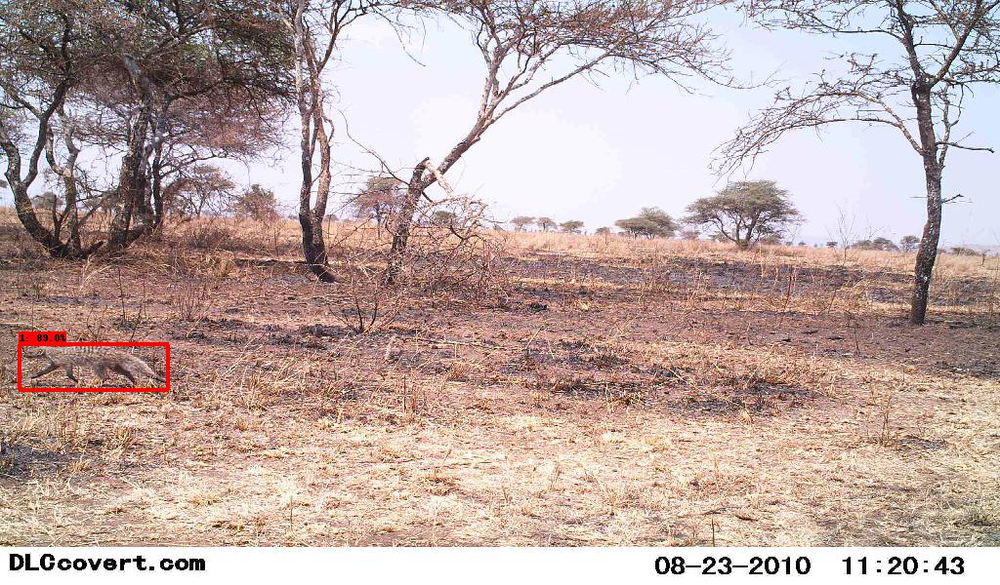


S1_D04_R6_PICT0129.JPG


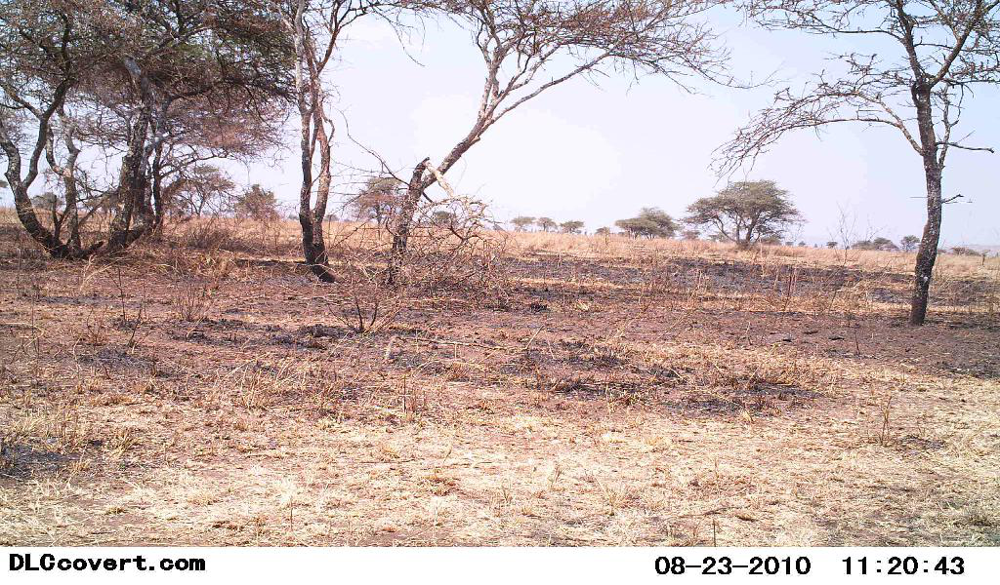


S1_D04_R6_PICT0130.JPG


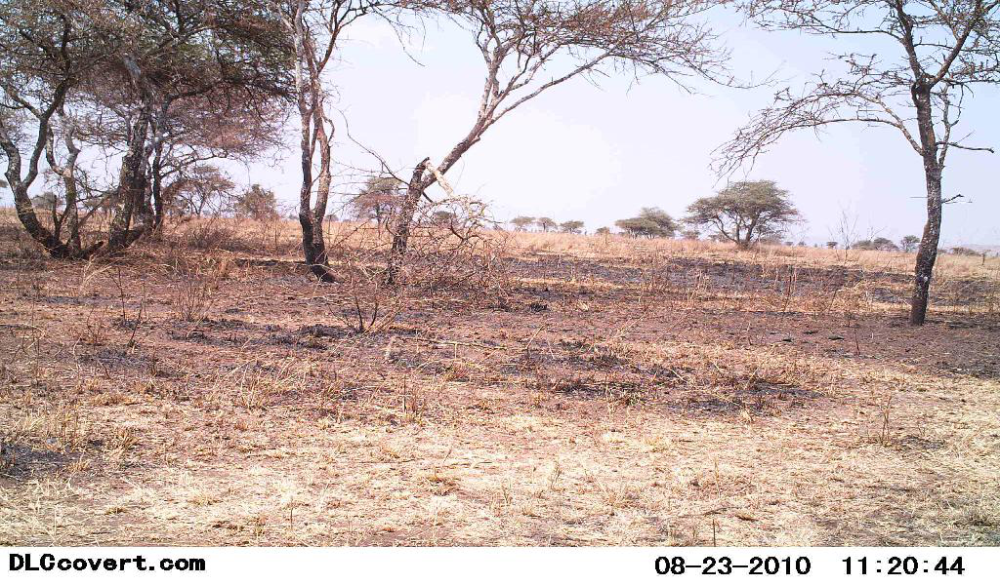


S1_D04_R6_PICT0221.JPG


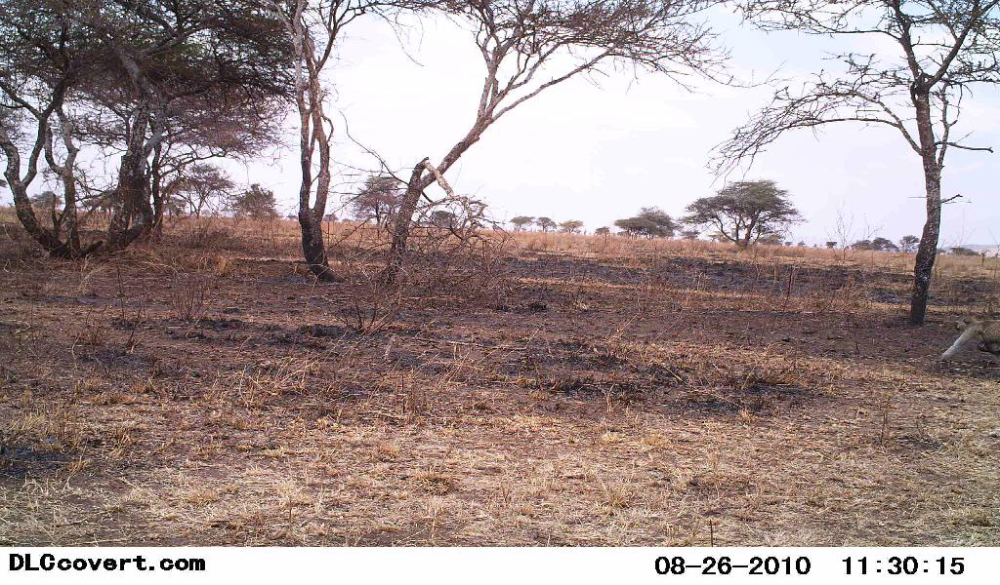


S1_D04_R6_PICT0222.JPG


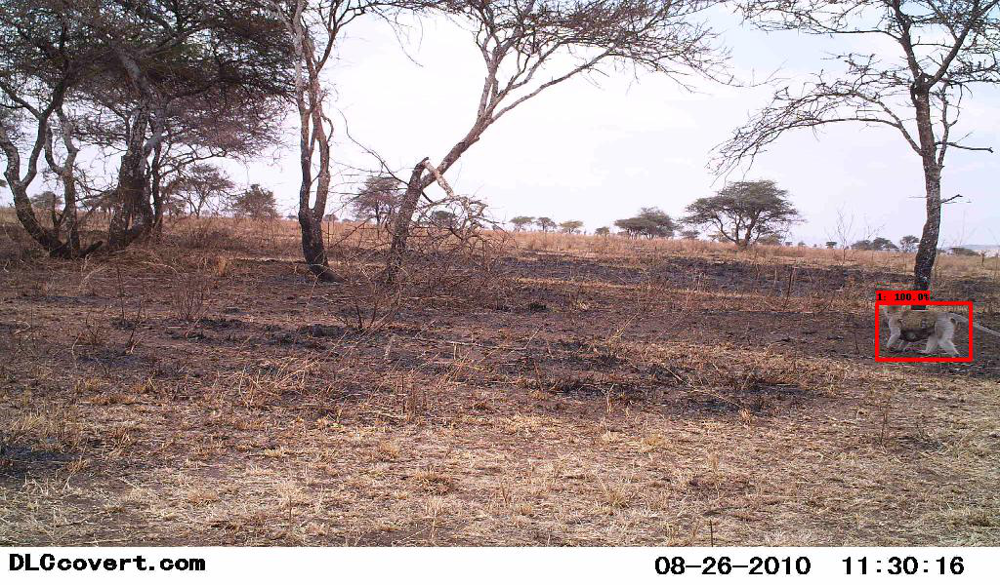

In [13]:
for img_name, img in sorted(images.items()):
    print(img_name)
    img
    print()